# YOLOv1 для детекции и подсчёта окон в здании

В данном ноутбуке будет построена модель YOLOv1. Обучение шло 3 дня ввиду ограниченности бесплатного GPU в Google Colab и необходимости обучать на CPU.

In [1]:
import torch
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.transforms.functional as FT
from tqdm import tqdm
from torch.utils.data import DataLoader
from model import Yolov1
from dataset import VOCDataset
from utils import(
    intersection_over_union,
    non_max_suppression,
    mean_average_precision,
    cellboxes_to_boxes,
    get_bboxes,
    plot_image,
    save_checkpoint,
    load_checkpoint,
)

In [2]:
import pandas as pd
import os

In [3]:
from loss import YoloLoss

Подготовим данные об изображениях и их аннотациях, необходимые для класса Dataset, разбив их на два csv-файла, содержащих пары названий файлов самих изображений и названий файлов их аннотаций.

In [ ]:
def prepare_data(img_path:str, labels_path:str, output_path:str):
    ''' Merges labels and images with the same name and split it in train.csv and test.csv
        for YOLO dataset format.
    '''
    labels = pd.DataFrame(os.listdir(labels_path))
    images = pd.DataFrame(os.listdir(img_path))
    images['key'] = images[0].apply(lambda x: x[:-4])
    labels['key'] = labels[0].apply(lambda x: x[:-4])
    res = pd.merge(labels, images, on=['key', 'key'])
    labels[0] = res['0_y']
    labels[1] = res['0_x']
    labels = labels.drop(columns=['key'])
    train_csv = labels[:1000]
    test_csv = labels[1000:]
    train_csv = train_csv.reset_index(drop=True)
    test_csv = test_csv.reset_index(drop=True)
    train_csv.to_csv(output_path + '/train.csv', sep=',', index=False, header=False)
    test_csv.to_csv(output_path + '/test.csv', sep=',', index=False, header=False)

In [18]:
#seed = 123
#torch.manual_seed(seed)

LEARNING_RATE = 2e-4
DEVICE = 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 200
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = True
LOAD_MODEL_FILE = 'Yolov1.pth.tar'
IMG_DIR = 'D:/CV/TrainDet'
LABEL_DIR = 'D:/CV/LabelDet'

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms
        
    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes
            
        return img, bboxes
            
transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])

def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []
    
    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        loop.set_postfix(loss=loss.item())
    print(f'Mean loss was {sum(mean_loss)/len(mean_loss)}')
    
def main():
    model = Yolov1(split_size=7, num_boxes=2, num_classes=1).to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,
                          weight_decay=WEIGHT_DECAY,
                          )
    loss_fn = YoloLoss()
    
    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)
        
    train_dataset = VOCDataset(
        'D:/CV/train.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    test_dataset = VOCDataset(
        'D:/CV/test.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    for epoch in range(EPOCHS):
        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4
        )
        
        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format='midpoint'
        )
        print(f'Train mAP: {mean_avg_prec}')
        
        if epoch % 10 == 0 and epoch > 0:
            checkpoint = {
              'state_dict': model.state_dict(),
              'optimizer': optimizer.state_dict(),
          }
            save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)
            import time
        
            time.sleep(10)
        
        train_fn(train_loader, model, optimizer, loss_fn)
        
if __name__ == '__main__':
    main()

Train mAP: 0.0


100%|██████████| 15/15 [03:08<00:00, 12.57s/it, loss=891]    


Mean loss was 2042.1970743815104
Train mAP: 0.00040357772377319634


100%|██████████| 15/15 [02:50<00:00, 11.36s/it, loss=632]   


Mean loss was 741.6445353190104
Train mAP: 0.0009928460931405425


100%|██████████| 15/15 [02:54<00:00, 11.61s/it, loss=587]


Mean loss was 666.4675211588542
Train mAP: 2.257730193377938e-05


100%|██████████| 15/15 [03:00<00:00, 12.06s/it, loss=545]


Mean loss was 620.3535563151041
Train mAP: 0.0004319529398344457


100%|██████████| 15/15 [02:39<00:00, 10.66s/it, loss=557]


Mean loss was 579.2201883951823
Train mAP: 0.0008052181219682097


100%|██████████| 15/15 [03:07<00:00, 12.49s/it, loss=563]


Mean loss was 526.1270690917969
Train mAP: 0.0011652238899841905


100%|██████████| 15/15 [03:00<00:00, 12.01s/it, loss=662]


Mean loss was 558.4404500325521
Train mAP: 0.0012271200539544225


100%|██████████| 15/15 [02:43<00:00, 10.93s/it, loss=490]


Mean loss was 508.23781127929686
Train mAP: 0.0006388256442733109


100%|██████████| 15/15 [02:59<00:00, 11.94s/it, loss=438]


Mean loss was 488.67930094401044
Train mAP: 0.00110303342808038


100%|██████████| 15/15 [02:40<00:00, 10.67s/it, loss=438]


Mean loss was 496.6324849446615
Train mAP: 0.0012578205205500126
=> Saving checkpoint


100%|██████████| 15/15 [02:55<00:00, 11.72s/it, loss=382]


Mean loss was 477.3067220052083
Train mAP: 0.0008041656110435724


100%|██████████| 15/15 [02:45<00:00, 11.05s/it, loss=456]


Mean loss was 462.8731953938802
Train mAP: 0.000733417458832264


100%|██████████| 15/15 [02:34<00:00, 10.28s/it, loss=365]


Mean loss was 445.6413167317708
Train mAP: 0.0012390693882480264


100%|██████████| 15/15 [03:26<00:00, 13.80s/it, loss=387]


Mean loss was 440.26964518229164
Train mAP: 0.0015414892695844173


100%|██████████| 15/15 [02:42<00:00, 10.86s/it, loss=524]


Mean loss was 444.9518107096354
Train mAP: 0.001398665364831686


100%|██████████| 15/15 [02:57<00:00, 11.80s/it, loss=442]


Mean loss was 459.6734334309896
Train mAP: 0.0012722838437184691


100%|██████████| 15/15 [03:01<00:00, 12.08s/it, loss=404]


Mean loss was 445.90163167317706
Train mAP: 0.001344165881164372


 27%|██▋       | 4/15 [00:56<02:34, 14.03s/it, loss=475]


KeyboardInterrupt: 

In [58]:
#seed = 123
#torch.manual_seed(seed)

LEARNING_RATE = 2e-4
DEVICE = 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 200
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = False
LOAD_MODEL_FILE = 'Yolov1.pth.tar'
IMG_DIR = 'D:/dataset/JPEGImages'
LABEL_DIR = 'D:/dataset/labels'

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms
        
    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes
            
        return img, bboxes
            
transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])

def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []
    
    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        loop.set_postfix(loss=loss.item())
    print(f'Mean loss was {sum(mean_loss)/len(mean_loss)}')
    
def main():
    model = Yolov1(split_size=7, num_boxes=2, num_classes=1).to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,
                          weight_decay=WEIGHT_DECAY,
                          )
    loss_fn = YoloLoss()
    
    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)
        
    train_dataset = VOCDataset(
        'D:/dataset/train.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    test_dataset = VOCDataset(
        'D:/dataset/test.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    for epoch in range(EPOCHS):
        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4
        )
        
        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format='midpoint'
        )
        print(f'Train mAP: {mean_avg_prec}')
        
        if epoch % 10 == 0 and epoch > 0:
            checkpoint = {
              'state_dict': model.state_dict(),
              'optimizer': optimizer.state_dict(),
          }
            save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)
            import time
        
            time.sleep(10)
        
        train_fn(train_loader, model, optimizer, loss_fn)
        
if __name__ == '__main__':
    main()

Train mAP: 0.0


100%|██████████| 63/63 [11:02<00:00, 10.52s/it, loss=214]   


Mean loss was 512.6762705000621
Train mAP: 0.0007355855777859688


100%|██████████| 63/63 [12:32<00:00, 11.94s/it, loss=89.4]


Mean loss was 294.2328544495598
Train mAP: 0.0018187424866482615


100%|██████████| 63/63 [14:21<00:00, 13.67s/it, loss=97.7]


Mean loss was 252.38265167720735
Train mAP: 0.001586198341101408


100%|██████████| 63/63 [23:12<00:00, 22.10s/it, loss=75.9]


Mean loss was 238.8842565142919
Train mAP: 0.0022368317004293203


100%|██████████| 63/63 [18:26<00:00, 17.56s/it, loss=84] 


Mean loss was 229.44596184624567
Train mAP: 0.0013925659004598856


100%|██████████| 63/63 [23:28<00:00, 22.36s/it, loss=142]


Mean loss was 216.48301720997645
Train mAP: 0.003035078290849924


100%|██████████| 63/63 [20:13<00:00, 19.26s/it, loss=101]


Mean loss was 206.42729102240668
Train mAP: 0.009088181890547276


100%|██████████| 63/63 [10:47<00:00, 10.28s/it, loss=175]


Mean loss was 197.37368943956164
Train mAP: 0.006907987408339977


100%|██████████| 63/63 [10:36<00:00, 10.10s/it, loss=88.3]


Mean loss was 192.11207846989709
Train mAP: 0.004517415538430214


100%|██████████| 63/63 [09:44<00:00,  9.28s/it, loss=60.6]


Mean loss was 185.62738485184926
Train mAP: 0.00827751588076353
=> Saving checkpoint


100%|██████████| 63/63 [09:42<00:00,  9.24s/it, loss=56] 


Mean loss was 187.15110409449017
Train mAP: 0.005962285213172436


100%|██████████| 63/63 [10:16<00:00,  9.79s/it, loss=82.9]


Mean loss was 186.61708202059307
Train mAP: 0.005039881449192762


100%|██████████| 63/63 [09:44<00:00,  9.28s/it, loss=75.1]


Mean loss was 169.95067087809244
Train mAP: 0.01358488667756319


100%|██████████| 63/63 [11:15:14<00:00, 643.08s/it, loss=99.5]    


Mean loss was 179.45003376309833
Train mAP: 0.008519926108419895


100%|██████████| 63/63 [10:45<00:00, 10.25s/it, loss=65.9]


Mean loss was 170.92998795282273
Train mAP: 0.01629880629479885


100%|██████████| 63/63 [43:22<00:00, 41.31s/it, loss=50.5]  


Mean loss was 159.7639528910319
Train mAP: 0.008805065415799618


100%|██████████| 63/63 [11:24<00:00, 10.86s/it, loss=44.3]


Mean loss was 146.6493897210984
Train mAP: 0.03614448010921478


100%|██████████| 63/63 [11:22<00:00, 10.83s/it, loss=79.4]


Mean loss was 138.9002879309276
Train mAP: 0.05216598138213158


100%|██████████| 63/63 [11:35<00:00, 11.04s/it, loss=41.8]


Mean loss was 126.07464841812376
Train mAP: 0.07689327001571655


100%|██████████| 63/63 [12:00<00:00, 11.44s/it, loss=42.6]


Mean loss was 120.4618904477074
Train mAP: 0.0719197690486908
=> Saving checkpoint


100%|██████████| 63/63 [11:28<00:00, 10.93s/it, loss=48.7]


Mean loss was 114.69052105858212
Train mAP: 0.08083901554346085


 24%|██▍       | 15/63 [02:57<09:28, 11.84s/it, loss=113] 


KeyboardInterrupt: 

In [ ]:
LEARNING_RATE = 2e-4
DEVICE = 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 200
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = True
LOAD_MODEL_FILE = 'Yolov1.pth.tar'
IMG_DIR = 'D:/dataset/JPEGImages'
LABEL_DIR = 'D:/dataset/labels'

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms
        
    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes
            
        return img, bboxes
            
transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])

def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []
    
    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        loop.set_postfix(loss=loss.item())
    print(f'Mean loss was {sum(mean_loss)/len(mean_loss)}')
    
def main():
    model = Yolov1(split_size=7, num_boxes=2, num_classes=1).to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,
                          weight_decay=WEIGHT_DECAY,
                          )
    loss_fn = YoloLoss()
    
    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)
        
    train_dataset = VOCDataset(
        'D:/dataset/train.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    test_dataset = VOCDataset(
        'D:/dataset/test.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    for epoch in range(EPOCHS):
        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4
        )
        
        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format='midpoint'
        )
        print(f'Train mAP: {mean_avg_prec}')
        
        if epoch % 10 == 0 and epoch > 0:
            checkpoint = {
              'state_dict': model.state_dict(),
              'optimizer': optimizer.state_dict(),
          }
            save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)
            import time
        
            time.sleep(10)
        
        train_fn(train_loader, model, optimizer, loss_fn)
        
if __name__ == '__main__':
    main()

=> Loading checkpoint
Train mAP: 0.07191970199346542


100%|██████████| 63/63 [19:46<00:00, 18.84s/it, loss=45.4]


Mean loss was 115.21431017678881
Train mAP: 0.07817697525024414


100%|██████████| 63/63 [18:50<00:00, 17.95s/it, loss=48.9]


Mean loss was 109.44668324788411
Train mAP: 0.06961758434772491


100%|██████████| 63/63 [12:03<00:00, 11.49s/it, loss=50.4]


Mean loss was 105.16201564243862
Train mAP: 0.0918411910533905


100%|██████████| 63/63 [10:50<00:00, 10.33s/it, loss=33.2]


Mean loss was 100.2711659991552
Train mAP: 0.11665648967027664


100%|██████████| 63/63 [10:40<00:00, 10.16s/it, loss=39.1]


Mean loss was 98.67382055615622
Train mAP: 0.12726925313472748


100%|██████████| 63/63 [10:28<00:00,  9.97s/it, loss=33.1]


Mean loss was 89.26052565801712
Train mAP: 0.15203191339969635


100%|██████████| 63/63 [10:34<00:00, 10.07s/it, loss=76.7]


Mean loss was 84.19920433892145
Train mAP: 0.17379003763198853


100%|██████████| 63/63 [10:36<00:00, 10.10s/it, loss=40.3]


Mean loss was 79.2959939865839
Train mAP: 0.15762129426002502


100%|██████████| 63/63 [10:26<00:00,  9.94s/it, loss=26.7]


Mean loss was 73.99368255857438
Train mAP: 0.20927663147449493


100%|██████████| 63/63 [10:17<00:00,  9.80s/it, loss=38.5]


Mean loss was 83.5624873448932
Train mAP: 0.21395522356033325
=> Saving checkpoint


100%|██████████| 63/63 [10:25<00:00,  9.93s/it, loss=39.9]


Mean loss was 86.22291316683331
Train mAP: 0.2143034189939499


100%|██████████| 63/63 [10:14<00:00,  9.76s/it, loss=33.6]


Mean loss was 76.01486714680989
Train mAP: 0.2096504271030426


100%|██████████| 63/63 [10:47<00:00, 10.28s/it, loss=26.1]


Mean loss was 70.27948985024103
Train mAP: 0.2825535535812378


100%|██████████| 63/63 [12:01<00:00, 11.45s/it, loss=25.8]


Mean loss was 60.97834726363894
Train mAP: 0.3004817068576813


100%|██████████| 63/63 [11:30<00:00, 10.96s/it, loss=22.8]


Mean loss was 57.5719242398701
Train mAP: 0.3470289707183838


100%|██████████| 63/63 [11:14<00:00, 10.71s/it, loss=23]  


Mean loss was 52.145607448759534
Train mAP: 0.3781873881816864


100%|██████████| 63/63 [10:56<00:00, 10.43s/it, loss=31.9]


Mean loss was 50.14831815447126
Train mAP: 0.3671635389328003


100%|██████████| 63/63 [09:52<00:00,  9.40s/it, loss=31.7]


Mean loss was 47.63172858101981
Train mAP: 0.3818477690219879


100%|██████████| 63/63 [09:55<00:00,  9.45s/it, loss=25.8]


Mean loss was 44.732116759769504
Train mAP: 0.4964081645011902


100%|██████████| 63/63 [09:53<00:00,  9.42s/it, loss=20.2]


Mean loss was 41.8502081613692
Train mAP: 0.4509395658969879
=> Saving checkpoint


100%|██████████| 63/63 [09:53<00:00,  9.41s/it, loss=15.4]


Mean loss was 40.25348732963441
Train mAP: 0.5119279026985168


100%|██████████| 63/63 [09:51<00:00,  9.38s/it, loss=26.2]


Mean loss was 38.111274295383026
Train mAP: 0.5474360585212708


100%|██████████| 63/63 [09:56<00:00,  9.46s/it, loss=16.4]


Mean loss was 35.721246991838726
Train mAP: 0.5058955550193787


100%|██████████| 63/63 [09:53<00:00,  9.42s/it, loss=24.2]


Mean loss was 36.01956912449428
Train mAP: 0.5299258828163147


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=13.6]


Mean loss was 33.88848253280398
Train mAP: 0.4608922302722931


100%|██████████| 63/63 [09:49<00:00,  9.36s/it, loss=11.3]


Mean loss was 33.33233781844851
Train mAP: 0.5424274206161499


100%|██████████| 63/63 [10:06<00:00,  9.63s/it, loss=11.9]


Mean loss was 32.22190063718765
Train mAP: 0.4776472747325897


100%|██████████| 63/63 [10:11<00:00,  9.71s/it, loss=22.6]


Mean loss was 32.773402864970855
Train mAP: 0.37471911311149597


100%|██████████| 63/63 [10:09<00:00,  9.68s/it, loss=26.6]


Mean loss was 35.59876202780103
Train mAP: 0.1481374204158783


100%|██████████| 63/63 [09:49<00:00,  9.37s/it, loss=11.9]


Mean loss was 42.819524492536274
Train mAP: 0.4911418855190277
=> Saving checkpoint


 54%|█████▍    | 34/63 [05:56<06:13, 12.89s/it, loss=33.7]

In [61]:
LEARNING_RATE = 2e-4
DEVICE = 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 200
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = True
LOAD_MODEL_FILE = 'Yolov1.pth.tar'
IMG_DIR = 'D:/dataset/JPEGImages'
LABEL_DIR = 'D:/dataset/labels'

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms
        
    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes
            
        return img, bboxes
            
transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])

def train_fn(train_loader, model, optimizer, loss_fn):
    loop = tqdm(train_loader, leave=True)
    mean_loss = []
    
    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        loop.set_postfix(loss=loss.item())
    print(f'Mean loss was {sum(mean_loss)/len(mean_loss)}')
    
def main():
    model = Yolov1(split_size=7, num_boxes=2, num_classes=1).to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,
                          weight_decay=WEIGHT_DECAY,
                          )
    loss_fn = YoloLoss()
    
    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)
        
    train_dataset = VOCDataset(
        'D:/dataset/train.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    test_dataset = VOCDataset(
        'D:/dataset/test.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,
    )
    
    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
    )
    
    for epoch in range(EPOCHS):
        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4
        )
        
        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format='midpoint'
        )
        print(f'Train mAP: {mean_avg_prec}')
        
        if epoch % 10 == 0 and epoch > 0:
            checkpoint = {
              'state_dict': model.state_dict(),
              'optimizer': optimizer.state_dict(),
          }
            save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)
            import time
        
            time.sleep(10)
        
        train_fn(train_loader, model, optimizer, loss_fn)
        
if __name__ == '__main__':
    main()

=> Loading checkpoint
Train mAP: 0.49114182591438293


100%|██████████| 63/63 [17:13<00:00, 16.40s/it, loss=18.9]


Mean loss was 35.94279598054432
Train mAP: 0.5358113050460815


100%|██████████| 63/63 [18:42<00:00, 17.81s/it, loss=12.4]


Mean loss was 31.732132608928378
Train mAP: 0.5025500059127808


100%|██████████| 63/63 [21:34<00:00, 20.55s/it, loss=15.4]


Mean loss was 29.623449249873087
Train mAP: 0.5677946209907532


100%|██████████| 63/63 [16:13<00:00, 15.45s/it, loss=17.2]


Mean loss was 25.89725312732515
Train mAP: 0.6893837451934814


100%|██████████| 63/63 [12:46<00:00, 12.17s/it, loss=15.6]


Mean loss was 25.222213518051873
Train mAP: 0.4644453525543213


100%|██████████| 63/63 [11:36<00:00, 11.06s/it, loss=12.6]


Mean loss was 26.092923058403862
Train mAP: 0.6286653280258179


100%|██████████| 63/63 [11:03<00:00, 10.53s/it, loss=6.29]


Mean loss was 22.48583974535503
Train mAP: 0.6367624998092651


100%|██████████| 63/63 [11:14<00:00, 10.70s/it, loss=13.6]


Mean loss was 22.95095492166186
Train mAP: 0.6421205997467041


100%|██████████| 63/63 [11:09<00:00, 10.62s/it, loss=11.5]


Mean loss was 22.668335929749503
Train mAP: 0.4310832917690277


100%|██████████| 63/63 [10:46<00:00, 10.27s/it, loss=13.6]


Mean loss was 24.206356487576922
Train mAP: 0.4113183915615082
=> Saving checkpoint


100%|██████████| 63/63 [10:06<00:00,  9.63s/it, loss=14.1]


Mean loss was 23.669500850495837
Train mAP: 0.6311331987380981


100%|██████████| 63/63 [10:03<00:00,  9.57s/it, loss=8.36]


Mean loss was 20.515458742777508
Train mAP: 0.6581487059593201


100%|██████████| 63/63 [09:59<00:00,  9.52s/it, loss=9.19]


Mean loss was 18.539626636202374
Train mAP: 0.3582707941532135


100%|██████████| 63/63 [10:00<00:00,  9.52s/it, loss=19.2]


Mean loss was 20.109225182306197
Train mAP: 0.24245843291282654


100%|██████████| 63/63 [10:04<00:00,  9.60s/it, loss=9.53]


Mean loss was 34.00371374402727
Train mAP: 0.6106844544410706


100%|██████████| 63/63 [09:47<00:00,  9.33s/it, loss=24.4]


Mean loss was 45.664188142806765
Train mAP: 0.43670663237571716


100%|██████████| 63/63 [09:54<00:00,  9.43s/it, loss=12.6]


Mean loss was 40.58711301712763
Train mAP: 0.5323586463928223


100%|██████████| 63/63 [09:58<00:00,  9.51s/it, loss=17.6]


Mean loss was 33.17167469811818
Train mAP: 0.6114181280136108


100%|██████████| 63/63 [10:00<00:00,  9.54s/it, loss=20.8]


Mean loss was 24.76804006667364
Train mAP: 0.6712244153022766


100%|██████████| 63/63 [09:57<00:00,  9.49s/it, loss=10.8]


Mean loss was 22.384097598847887
Train mAP: 0.6233785152435303
=> Saving checkpoint


100%|██████████| 63/63 [10:03<00:00,  9.58s/it, loss=6.55]


Mean loss was 21.76590066485935
Train mAP: 0.6799085140228271


100%|██████████| 63/63 [10:12<00:00,  9.73s/it, loss=12.8]


Mean loss was 19.500516301109677
Train mAP: 0.5808618068695068


100%|██████████| 63/63 [09:59<00:00,  9.52s/it, loss=14.8]


Mean loss was 21.934664907909575
Train mAP: 0.7209713459014893


100%|██████████| 63/63 [10:08<00:00,  9.66s/it, loss=11.9]


Mean loss was 19.286553715902663
Train mAP: 0.7296667098999023


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=6.86]


Mean loss was 15.748167287735711
Train mAP: 0.7418272495269775


100%|██████████| 63/63 [09:57<00:00,  9.48s/it, loss=6.34]


Mean loss was 15.467614537193661
Train mAP: 0.6905825138092041


100%|██████████| 63/63 [09:58<00:00,  9.50s/it, loss=4.25]


Mean loss was 13.795266719091506
Train mAP: 0.7268232703208923


100%|██████████| 63/63 [09:57<00:00,  9.48s/it, loss=6.06]


Mean loss was 12.692002001262846
Train mAP: 0.7367949485778809


100%|██████████| 63/63 [09:57<00:00,  9.48s/it, loss=7.25]


Mean loss was 12.773341988760327
Train mAP: 0.750580906867981


100%|██████████| 63/63 [09:55<00:00,  9.45s/it, loss=6.26]


Mean loss was 14.091364557780917
Train mAP: 0.706076443195343
=> Saving checkpoint


100%|██████████| 63/63 [09:54<00:00,  9.43s/it, loss=34]  


Mean loss was 15.281214017716666
Train mAP: 0.16798484325408936


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=33]  


Mean loss was 61.306928513542054
Train mAP: 0.30370426177978516


100%|██████████| 63/63 [09:52<00:00,  9.40s/it, loss=55.6]


Mean loss was 61.08508736746652
Train mAP: 0.1129334345459938


100%|██████████| 63/63 [09:49<00:00,  9.36s/it, loss=27.1]


Mean loss was 76.68285627213736
Train mAP: 0.42872437834739685


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=17]  


Mean loss was 66.88698181273445
Train mAP: 0.33381953835487366


100%|██████████| 63/63 [09:52<00:00,  9.40s/it, loss=44.6]


Mean loss was 45.697687058221724
Train mAP: 0.5906657576560974


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=17.1]


Mean loss was 37.959940955752415
Train mAP: 0.6118714213371277


100%|██████████| 63/63 [10:17<00:00,  9.81s/it, loss=15.8]


Mean loss was 28.52313983251178
Train mAP: 0.6401077508926392


100%|██████████| 63/63 [10:17<00:00,  9.80s/it, loss=9.7] 


Mean loss was 24.022802413456024
Train mAP: 0.695268452167511


100%|██████████| 63/63 [09:53<00:00,  9.42s/it, loss=15.8]


Mean loss was 23.045724550882976
Train mAP: 0.7424101829528809
=> Saving checkpoint


100%|██████████| 63/63 [09:58<00:00,  9.49s/it, loss=9.03]


Mean loss was 19.82983169858418
Train mAP: 0.7242547869682312


100%|██████████| 63/63 [09:50<00:00,  9.37s/it, loss=6.26]


Mean loss was 16.28898224754939
Train mAP: 0.7643659710884094


100%|██████████| 63/63 [09:58<00:00,  9.50s/it, loss=9.79]


Mean loss was 16.13982451908172
Train mAP: 0.7798397541046143


100%|██████████| 63/63 [09:56<00:00,  9.47s/it, loss=4.14]


Mean loss was 13.425544594961499
Train mAP: 0.7973233461380005


100%|██████████| 63/63 [09:52<00:00,  9.41s/it, loss=6.36]


Mean loss was 11.44869895965334
Train mAP: 0.7770997881889343


100%|██████████| 63/63 [09:56<00:00,  9.47s/it, loss=5.24]


Mean loss was 10.255844048091344
Train mAP: 0.790781557559967


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=4.86]


Mean loss was 10.159613162752182
Train mAP: 0.8277974724769592


100%|██████████| 63/63 [09:59<00:00,  9.52s/it, loss=4.07]


Mean loss was 10.206567045242068
Train mAP: 0.7957836389541626


100%|██████████| 63/63 [09:55<00:00,  9.46s/it, loss=3.45]


Mean loss was 9.158781819873386
Train mAP: 0.8108957409858704


100%|██████████| 63/63 [10:03<00:00,  9.57s/it, loss=4.16]


Mean loss was 8.901733292473686
Train mAP: 0.824732780456543
=> Saving checkpoint


100%|██████████| 63/63 [09:55<00:00,  9.45s/it, loss=5.96]


Mean loss was 8.350413216484917
Train mAP: 0.7898814678192139


100%|██████████| 63/63 [10:01<00:00,  9.55s/it, loss=3.37]


Mean loss was 8.17843246459961
Train mAP: 0.8089080452919006


100%|██████████| 63/63 [10:01<00:00,  9.54s/it, loss=3.71]


Mean loss was 9.383224158059983
Train mAP: 0.8122496008872986


100%|██████████| 63/63 [10:04<00:00,  9.60s/it, loss=7.66]


Mean loss was 13.017311868213472
Train mAP: 0.3256436586380005


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=18.7]


Mean loss was 41.289193168519034
Train mAP: 0.4234507083892822


100%|██████████| 63/63 [09:58<00:00,  9.51s/it, loss=16.6]


Mean loss was 26.912202108474006
Train mAP: 0.6634060144424438


100%|██████████| 63/63 [10:10<00:00,  9.69s/it, loss=11.9]


Mean loss was 21.12865081666008
Train mAP: 0.7064285278320312


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=8.22]


Mean loss was 19.382931875804115
Train mAP: 0.7393096089363098


100%|██████████| 63/63 [09:59<00:00,  9.51s/it, loss=5.68]


Mean loss was 15.858856034657311
Train mAP: 0.7477405071258545


100%|██████████| 63/63 [09:54<00:00,  9.44s/it, loss=6.33]


Mean loss was 16.131658183203804
Train mAP: 0.2394661009311676
=> Saving checkpoint


100%|██████████| 63/63 [09:58<00:00,  9.50s/it, loss=7.48]


Mean loss was 16.78994134872679
Train mAP: 0.7525427937507629


100%|██████████| 63/63 [09:56<00:00,  9.47s/it, loss=4.57]


Mean loss was 15.968682508620004
Train mAP: 0.7469260692596436


100%|██████████| 63/63 [09:51<00:00,  9.39s/it, loss=5.82]


Mean loss was 15.792813444894458
Train mAP: 0.7202614545822144


100%|██████████| 63/63 [09:55<00:00,  9.46s/it, loss=7.17]


Mean loss was 13.597045482151092
Train mAP: 0.7823551297187805


100%|██████████| 63/63 [10:01<00:00,  9.54s/it, loss=4.78]


Mean loss was 10.314704963139125
Train mAP: 0.807389497756958


100%|██████████| 63/63 [09:56<00:00,  9.46s/it, loss=2.98]


Mean loss was 9.188272884913854
Train mAP: 0.7898391485214233


100%|██████████| 63/63 [09:57<00:00,  9.48s/it, loss=4.56]


Mean loss was 9.058866939847432
Train mAP: 0.7678914070129395


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=3.76]


Mean loss was 7.840913159506662
Train mAP: 0.8203330039978027


100%|██████████| 63/63 [10:02<00:00,  9.56s/it, loss=2.32]


Mean loss was 8.094611947498624
Train mAP: 0.8340288996696472


100%|██████████| 63/63 [10:07<00:00,  9.64s/it, loss=6.71]


Mean loss was 9.936975978669667
Train mAP: 0.5735368728637695
=> Saving checkpoint


100%|██████████| 63/63 [10:41<00:00, 10.18s/it, loss=3.5] 


Mean loss was 14.604072215065123
Train mAP: 0.7348573207855225


100%|██████████| 63/63 [10:46<00:00, 10.25s/it, loss=8.89]


Mean loss was 11.045103050413585
Train mAP: 0.795978307723999


100%|██████████| 63/63 [11:02<00:00, 10.52s/it, loss=3.23]


Mean loss was 9.217789570490519
Train mAP: 0.8194424510002136


100%|██████████| 63/63 [12:19<00:00, 11.74s/it, loss=2.65]


Mean loss was 7.425709576833816
Train mAP: 0.8347506523132324


100%|██████████| 63/63 [11:07<00:00, 10.60s/it, loss=2.29]


Mean loss was 6.452589731367808
Train mAP: 0.8326653242111206


100%|██████████| 63/63 [11:27<00:00, 10.92s/it, loss=2.28]


Mean loss was 6.022401408543662
Train mAP: 0.8372512459754944


100%|██████████| 63/63 [11:27<00:00, 10.92s/it, loss=3.01]


Mean loss was 6.203309301346067
Train mAP: 0.8275854587554932


100%|██████████| 63/63 [11:18<00:00, 10.78s/it, loss=2.95]


Mean loss was 5.729265568748353
Train mAP: 0.8398506045341492


100%|██████████| 63/63 [10:02<00:00,  9.57s/it, loss=2.68]


Mean loss was 5.596452088583083
Train mAP: 0.838202178478241


100%|██████████| 63/63 [10:58<00:00, 10.45s/it, loss=3.08]


Mean loss was 6.663300934292021
Train mAP: 0.8345106244087219
=> Saving checkpoint


100%|██████████| 63/63 [11:00<00:00, 10.48s/it, loss=4.82]


Mean loss was 6.887807952033149
Train mAP: 0.8129473924636841


100%|██████████| 63/63 [10:40<00:00, 10.17s/it, loss=2.83]


Mean loss was 7.1562714122590565
Train mAP: 0.8231320381164551


100%|██████████| 63/63 [10:38<00:00, 10.14s/it, loss=4.82]


Mean loss was 6.934962772187733
Train mAP: 0.7296319007873535


100%|██████████| 63/63 [10:13<00:00,  9.74s/it, loss=2]   


Mean loss was 6.879129617933243
Train mAP: 0.818509578704834


100%|██████████| 63/63 [10:06<00:00,  9.63s/it, loss=1.67]


Mean loss was 6.3988932900958595
Train mAP: 0.8170021772384644


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=2.5] 


Mean loss was 5.949945438475836
Train mAP: 0.8079559206962585


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=2.61]


Mean loss was 6.6328229071601985
Train mAP: 0.8189644813537598


100%|██████████| 63/63 [10:08<00:00,  9.66s/it, loss=3.53]


Mean loss was 6.563516181612772
Train mAP: 0.7778254151344299


100%|██████████| 63/63 [10:17<00:00,  9.80s/it, loss=2.53]


Mean loss was 6.295559648483518
Train mAP: 0.8378474116325378


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=1.72]


Mean loss was 6.786792830815391
Train mAP: 0.8257437348365784
=> Saving checkpoint


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=2.52]


Mean loss was 6.418848136114696
Train mAP: 0.8050660490989685


100%|██████████| 63/63 [10:08<00:00,  9.66s/it, loss=3.78]


Mean loss was 6.588274917905292
Train mAP: 0.7927124500274658


100%|██████████| 63/63 [10:04<00:00,  9.60s/it, loss=2.81]


Mean loss was 6.279610054833548
Train mAP: 0.8319295644760132


100%|██████████| 63/63 [09:55<00:00,  9.45s/it, loss=1.91]


Mean loss was 6.7448184300982765
Train mAP: 0.8277105093002319


100%|██████████| 63/63 [10:16<00:00,  9.78s/it, loss=3.34]


Mean loss was 7.538129231286427
Train mAP: 0.7863691449165344


100%|██████████| 63/63 [10:10<00:00,  9.70s/it, loss=12.2]


Mean loss was 14.26545043975588
Train mAP: 0.7031312584877014


100%|██████████| 63/63 [10:08<00:00,  9.66s/it, loss=6.47]


Mean loss was 15.525809711880154
Train mAP: 0.8065782785415649


100%|██████████| 63/63 [10:05<00:00,  9.61s/it, loss=5.26]


Mean loss was 12.388571277497308
Train mAP: 0.7517831325531006


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=4.03]


Mean loss was 10.519024879213363
Train mAP: 0.7865607142448425


100%|██████████| 63/63 [10:09<00:00,  9.67s/it, loss=2.9] 


Mean loss was 8.29242760037619
Train mAP: 0.8141887187957764
=> Saving checkpoint


100%|██████████| 63/63 [10:06<00:00,  9.63s/it, loss=4.88]


Mean loss was 8.091703445192367
Train mAP: 0.7992497086524963


100%|██████████| 63/63 [10:09<00:00,  9.68s/it, loss=5.58]


Mean loss was 7.245191422719804
Train mAP: 0.8002596497535706


100%|██████████| 63/63 [10:15<00:00,  9.78s/it, loss=3.35]


Mean loss was 7.311348059820751
Train mAP: 0.8622711896896362


100%|██████████| 63/63 [10:12<00:00,  9.73s/it, loss=3.53]


Mean loss was 7.801303715932937
Train mAP: 0.8212990164756775


100%|██████████| 63/63 [10:07<00:00,  9.65s/it, loss=4.25]


Mean loss was 12.729325642661443
Train mAP: 0.7550675272941589


100%|██████████| 63/63 [10:04<00:00,  9.60s/it, loss=9.75]


Mean loss was 11.79212412758479
Train mAP: 0.5868299007415771


100%|██████████| 63/63 [10:08<00:00,  9.65s/it, loss=3.42]


Mean loss was 9.417515338413299
Train mAP: 0.8158129453659058


100%|██████████| 63/63 [10:01<00:00,  9.54s/it, loss=2.46]


Mean loss was 7.292033615566435
Train mAP: 0.8111688494682312


100%|██████████| 63/63 [10:08<00:00,  9.66s/it, loss=1.48]


Mean loss was 5.418408274650574
Train mAP: 0.8627011179924011


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=3.71]


Mean loss was 6.274432186096433
Train mAP: 0.831454873085022
=> Saving checkpoint


100%|██████████| 63/63 [10:15<00:00,  9.76s/it, loss=1.65]


Mean loss was 5.395920354222494
Train mAP: 0.8543233871459961


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=1.05]


Mean loss was 4.249965355509803
Train mAP: 0.8540045022964478


100%|██████████| 63/63 [10:09<00:00,  9.68s/it, loss=1.8] 


Mean loss was 4.074345433522785
Train mAP: 0.8595214486122131


100%|██████████| 63/63 [10:07<00:00,  9.64s/it, loss=5.8] 


Mean loss was 13.645355663602315
Train mAP: 0.47927573323249817


100%|██████████| 63/63 [10:12<00:00,  9.72s/it, loss=5.18]


Mean loss was 12.8657364693899
Train mAP: 0.7776408195495605


100%|██████████| 63/63 [10:16<00:00,  9.78s/it, loss=2.87]


Mean loss was 8.676468474524361
Train mAP: 0.8141486644744873


100%|██████████| 63/63 [10:12<00:00,  9.72s/it, loss=2.39]


Mean loss was 6.659071884458027
Train mAP: 0.842969536781311


100%|██████████| 63/63 [10:10<00:00,  9.70s/it, loss=2.89]


Mean loss was 5.542086184970916
Train mAP: 0.8186429142951965


100%|██████████| 63/63 [10:12<00:00,  9.72s/it, loss=1.8] 


Mean loss was 4.870223836293296
Train mAP: 0.8682510256767273


100%|██████████| 63/63 [10:07<00:00,  9.64s/it, loss=1.93]


Mean loss was 4.045226055478293
Train mAP: 0.8551437258720398
=> Saving checkpoint


100%|██████████| 63/63 [10:10<00:00,  9.69s/it, loss=2.59]


Mean loss was 3.7820828717852395
Train mAP: 0.857149064540863


100%|██████████| 63/63 [10:11<00:00,  9.71s/it, loss=1.82]


Mean loss was 3.5633133460604953
Train mAP: 0.8580009937286377


100%|██████████| 63/63 [10:12<00:00,  9.72s/it, loss=2.39]


Mean loss was 3.1962031504464528
Train mAP: 0.8662883043289185


100%|██████████| 63/63 [10:10<00:00,  9.70s/it, loss=0.956]


Mean loss was 3.4156991735337274
Train mAP: 0.8495213985443115


100%|██████████| 63/63 [10:07<00:00,  9.64s/it, loss=1.78]


Mean loss was 3.4343782379513694
Train mAP: 0.8689063191413879


100%|██████████| 63/63 [10:05<00:00,  9.61s/it, loss=1.48]


Mean loss was 3.1117780662718273
Train mAP: 0.8638441562652588


100%|██████████| 63/63 [10:44<00:00, 10.23s/it, loss=1.23]


Mean loss was 3.097065002199203
Train mAP: 0.8505810499191284


100%|██████████| 63/63 [10:47<00:00, 10.28s/it, loss=0.772]


Mean loss was 3.092363173053378
Train mAP: 0.8659689426422119


100%|██████████| 63/63 [10:47<00:00, 10.28s/it, loss=1.18]


Mean loss was 3.0422798792521157
Train mAP: 0.8572235703468323


100%|██████████| 63/63 [10:55<00:00, 10.40s/it, loss=1.67]


Mean loss was 3.291053821170141
Train mAP: 0.8543136119842529
=> Saving checkpoint


100%|██████████| 63/63 [10:59<00:00, 10.47s/it, loss=1.64]


Mean loss was 4.154326959261819
Train mAP: 0.8599687814712524


100%|██████████| 63/63 [10:46<00:00, 10.25s/it, loss=2.36]


Mean loss was 4.883249097400242
Train mAP: 0.8310277462005615


100%|██████████| 63/63 [10:35<00:00, 10.09s/it, loss=3.3] 


Mean loss was 6.356304289802672
Train mAP: 0.8369721174240112


100%|██████████| 63/63 [10:38<00:00, 10.13s/it, loss=4.55]


Mean loss was 7.74588850566319
Train mAP: 0.8200150728225708


100%|██████████| 63/63 [10:41<00:00, 10.18s/it, loss=2.4] 


Mean loss was 8.005651852441213
Train mAP: 0.8316267728805542


100%|██████████| 63/63 [10:53<00:00, 10.37s/it, loss=3.55]


Mean loss was 9.559313316193839
Train mAP: 0.8101438283920288


100%|██████████| 63/63 [10:54<00:00, 10.39s/it, loss=2.99]


Mean loss was 9.855717855786521
Train mAP: 0.7922096252441406


100%|██████████| 63/63 [10:54<00:00, 10.39s/it, loss=5.53]


Mean loss was 8.63832329946851
Train mAP: 0.7215749025344849


100%|██████████| 63/63 [10:50<00:00, 10.33s/it, loss=116] 


Mean loss was 81.78326640810285
Train mAP: 0.0061812070198357105


100%|██████████| 63/63 [10:44<00:00, 10.23s/it, loss=39.2]


Mean loss was 170.462891109406
Train mAP: 0.1637638807296753
=> Saving checkpoint


100%|██████████| 63/63 [09:58<00:00,  9.51s/it, loss=35.7]


Mean loss was 68.46225453936864
Train mAP: 0.5111199617385864


100%|██████████| 63/63 [09:58<00:00,  9.51s/it, loss=19.5]


Mean loss was 36.95832119290791
Train mAP: 0.6682078838348389


100%|██████████| 63/63 [09:59<00:00,  9.51s/it, loss=9.47]


Mean loss was 25.521987597147625
Train mAP: 0.7600581049919128


100%|██████████| 63/63 [09:59<00:00,  9.52s/it, loss=7.7] 


Mean loss was 19.75606019913204
Train mAP: 0.7800567746162415


100%|██████████| 63/63 [10:00<00:00,  9.53s/it, loss=7.28]


Mean loss was 14.666021596817743
Train mAP: 0.7903372049331665


100%|██████████| 63/63 [10:01<00:00,  9.55s/it, loss=5.09]


Mean loss was 12.280549276442756
Train mAP: 0.855427622795105


100%|██████████| 63/63 [10:04<00:00,  9.59s/it, loss=4.34]


Mean loss was 10.267521941472614
Train mAP: 0.840076744556427


100%|██████████| 63/63 [10:04<00:00,  9.60s/it, loss=2.94]


Mean loss was 8.886984234764462
Train mAP: 0.8675795197486877


100%|██████████| 63/63 [10:05<00:00,  9.61s/it, loss=3.66]


Mean loss was 7.630053921351357
Train mAP: 0.8702009916305542


100%|██████████| 63/63 [10:02<00:00,  9.56s/it, loss=2.09]


Mean loss was 6.326709126669263
Train mAP: 0.8715314269065857
=> Saving checkpoint


100%|██████████| 63/63 [10:21<00:00,  9.86s/it, loss=1.96]


Mean loss was 5.5526106622484
Train mAP: 0.8740804195404053


100%|██████████| 63/63 [10:51<00:00, 10.34s/it, loss=5.12]


Mean loss was 5.010720226499769
Train mAP: 0.8774428367614746


100%|██████████| 63/63 [10:20<00:00,  9.85s/it, loss=1.41]


Mean loss was 4.704596301865956
Train mAP: 0.8750309944152832


100%|██████████| 63/63 [11:12<00:00, 10.67s/it, loss=1.36]


Mean loss was 4.119547790951199
Train mAP: 0.8725758790969849


100%|██████████| 63/63 [11:12<00:00, 10.67s/it, loss=1.53]


Mean loss was 3.7836775704035683
Train mAP: 0.8847804069519043


100%|██████████| 63/63 [12:30<00:00, 11.92s/it, loss=2.04]


Mean loss was 4.055380594162714
Train mAP: 0.8719925880432129


100%|██████████| 63/63 [10:34<00:00, 10.07s/it, loss=1.42]


Mean loss was 3.8156884019337003
Train mAP: 0.8931971192359924


100%|██████████| 63/63 [10:54<00:00, 10.39s/it, loss=1.55]


Mean loss was 3.7571864128112793
Train mAP: 0.8989436626434326


100%|██████████| 63/63 [10:49<00:00, 10.30s/it, loss=1.26]


Mean loss was 3.50018600812034
Train mAP: 0.8824046850204468


100%|██████████| 63/63 [12:35<00:00, 12.00s/it, loss=2.18]


Mean loss was 3.3114050134779913
Train mAP: 0.8696469068527222
=> Saving checkpoint


100%|██████████| 63/63 [14:04<00:00, 13.40s/it, loss=1.42]


Mean loss was 2.9593785395697942
Train mAP: 0.8664128184318542


100%|██████████| 63/63 [18:07<00:00, 17.26s/it, loss=1.3] 


Mean loss was 2.9339746009735834
Train mAP: 0.8674623370170593


100%|██████████| 63/63 [18:29<00:00, 17.62s/it, loss=1.22]


Mean loss was 3.112400348224337
Train mAP: 0.8822908997535706


100%|██████████| 63/63 [18:27<00:00, 17.59s/it, loss=1.25]


Mean loss was 2.784474081463284
Train mAP: 0.8753170967102051


100%|██████████| 63/63 [18:22<00:00, 17.50s/it, loss=1.59]


Mean loss was 2.73311984539032
Train mAP: 0.8850357532501221


100%|██████████| 63/63 [18:24<00:00, 17.52s/it, loss=1.75]


Mean loss was 2.6943407210092696
Train mAP: 0.8712379932403564


100%|██████████| 63/63 [18:26<00:00, 17.57s/it, loss=1.12]


Mean loss was 2.75276523923117
Train mAP: 0.8774898648262024


100%|██████████| 63/63 [18:27<00:00, 17.58s/it, loss=1.08]


Mean loss was 2.993131959249103
Train mAP: 0.8923189640045166


100%|██████████| 63/63 [18:36<00:00, 17.72s/it, loss=0.825]


Mean loss was 3.162058355316283
Train mAP: 0.8752890229225159


100%|██████████| 63/63 [18:42<00:00, 17.82s/it, loss=1.51]


Mean loss was 3.178405578174288
Train mAP: 0.8950193524360657
=> Saving checkpoint


100%|██████████| 63/63 [18:59<00:00, 18.10s/it, loss=1.47]


Mean loss was 3.2975642700043934
Train mAP: 0.8839766979217529


100%|██████████| 63/63 [18:40<00:00, 17.79s/it, loss=1.73]


Mean loss was 3.3933283279812527
Train mAP: 0.8865043520927429


100%|██████████| 63/63 [18:37<00:00, 17.74s/it, loss=1.39]


Mean loss was 3.5080497435161044
Train mAP: 0.8736746311187744


 54%|█████▍    | 34/63 [10:40<09:06, 18.85s/it, loss=2.4] 


KeyboardInterrupt: 

Остановимся на Train mAP в 0.89.

Посмотрим, как модель справляется с детекцией на тестовом датасете:

In [9]:
LEARNING_RATE = 2e-4
DEVICE = 'cpu'
BATCH_SIZE = 16
WEIGHT_DECAY = 0
EPOCHS = 200
NUM_WORKERS = 0
PIN_MEMORY = True
LOAD_MODEL = True
LOAD_MODEL_FILE = 'Yolov1.pth.tar'
IMG_DIR = 'D:/dataset/JPEGImages'
LABEL_DIR = 'D:/dataset/labels'

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms
        
    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes
            
        return img, bboxes

transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])
test_dataset = VOCDataset(
        'D:/dataset/test.csv',
        transform=transform,
        img_dir=IMG_DIR,
        label_dir=LABEL_DIR,)
test_loader = DataLoader(
        dataset=test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=True,
        drop_last=False,
)

In [10]:
model = Yolov1(split_size=7, num_boxes=2, num_classes=1).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE,
                          weight_decay=WEIGHT_DECAY,
                          )

In [11]:
checkpoint = torch.load('D:/dataset/Yolov1Best89.pth.tar')
model.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

------ Окон на данном изображении: 23 --------


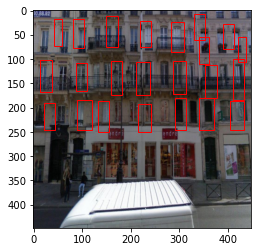

------ Окон на данном изображении: 3 --------


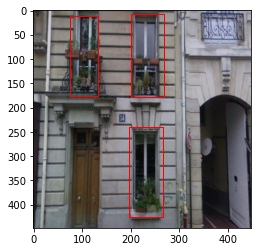

------ Окон на данном изображении: 4 --------


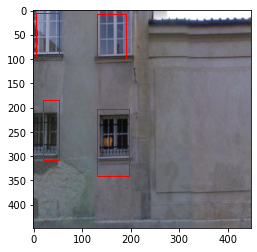

------ Окон на данном изображении: 6 --------


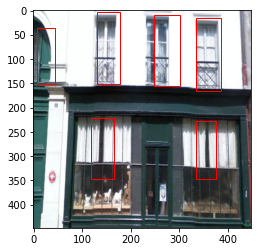

------ Окон на данном изображении: 4 --------


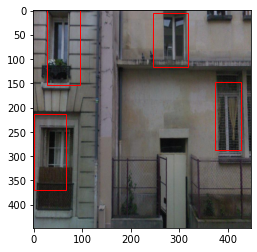

------ Окон на данном изображении: 4 --------


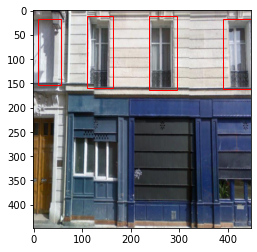

------ Окон на данном изображении: 6 --------


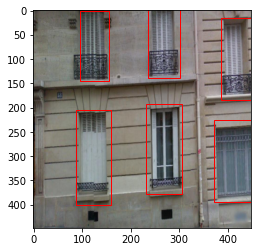

------ Окон на данном изображении: 3 --------


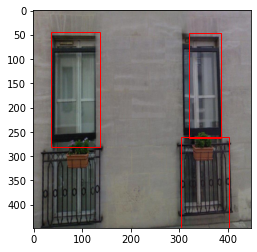

------ Окон на данном изображении: 4 --------


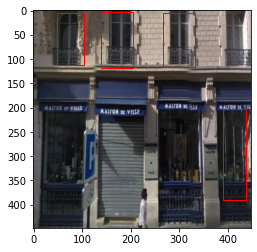

------ Окон на данном изображении: 4 --------


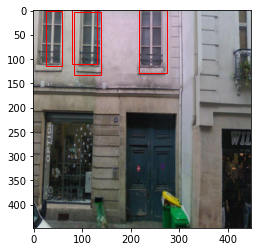

------ Окон на данном изображении: 7 --------


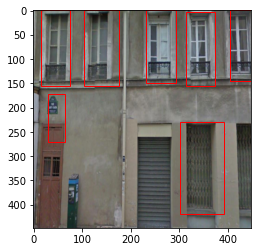

------ Окон на данном изображении: 5 --------


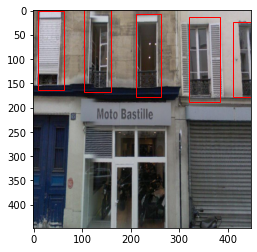

------ Окон на данном изображении: 5 --------


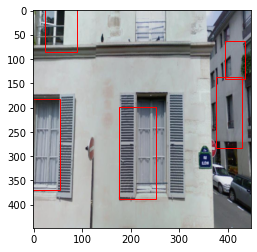

------ Окон на данном изображении: 4 --------


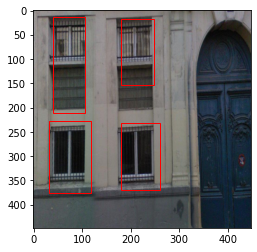

------ Окон на данном изображении: 4 --------


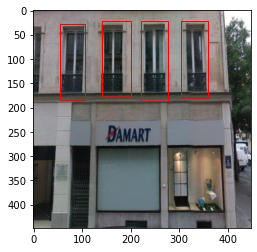

------ Окон на данном изображении: 6 --------


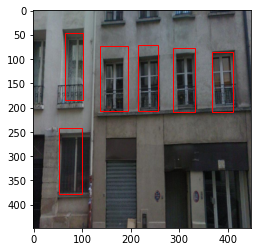

------ Окон на данном изображении: 6 --------


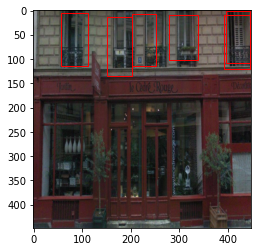

------ Окон на данном изображении: 3 --------


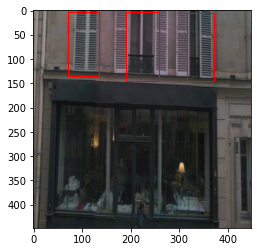

------ Окон на данном изображении: 5 --------


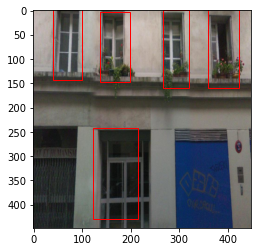

------ Окон на данном изображении: 5 --------


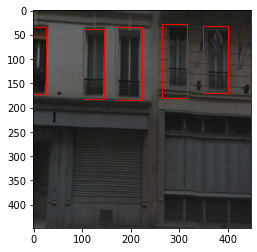

------ Окон на данном изображении: 3 --------


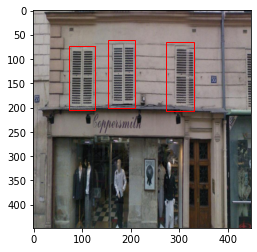

------ Окон на данном изображении: 18 --------


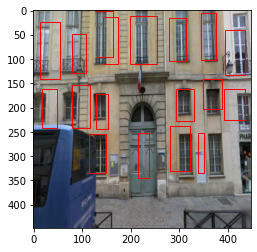

------ Окон на данном изображении: 3 --------


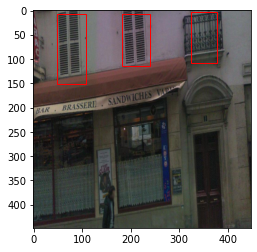

------ Окон на данном изображении: 0 --------


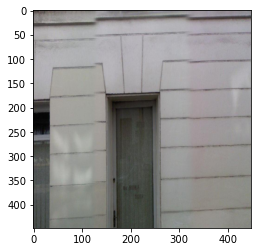

------ Окон на данном изображении: 2 --------


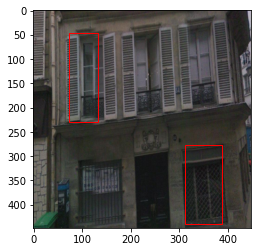

------ Окон на данном изображении: 4 --------


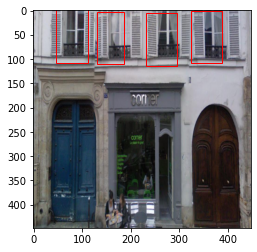

------ Окон на данном изображении: 5 --------


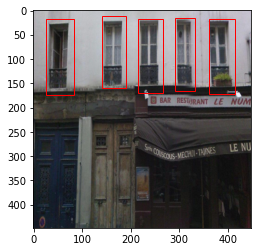

------ Окон на данном изображении: 5 --------


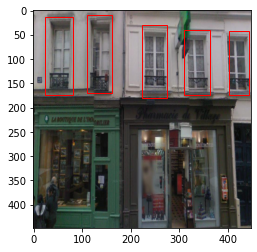

------ Окон на данном изображении: 5 --------


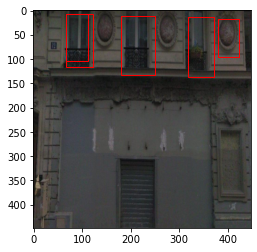

------ Окон на данном изображении: 6 --------


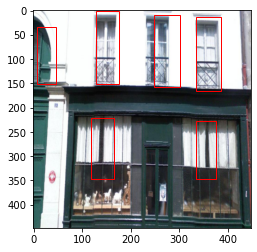

------ Окон на данном изображении: 15 --------


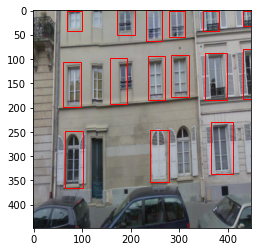

------ Окон на данном изображении: 6 --------


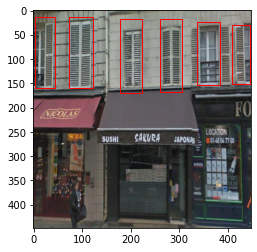

------ Окон на данном изображении: 6 --------


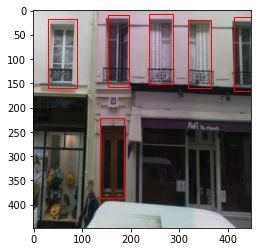

------ Окон на данном изображении: 13 --------


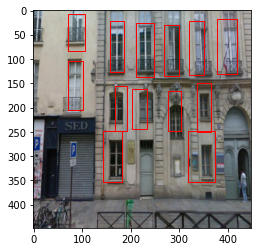

------ Окон на данном изображении: 3 --------


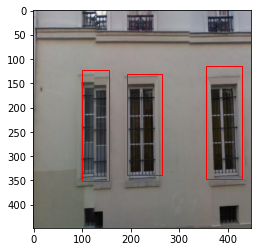

------ Окон на данном изображении: 4 --------


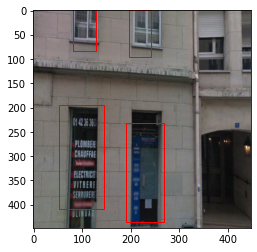

------ Окон на данном изображении: 4 --------


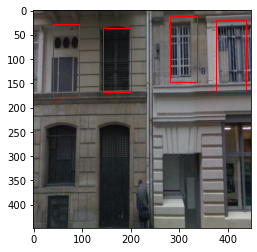

------ Окон на данном изображении: 9 --------


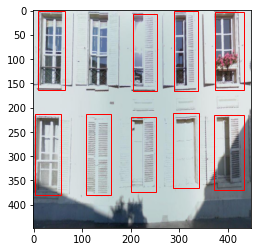

------ Окон на данном изображении: 3 --------


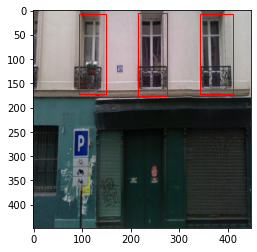

------ Окон на данном изображении: 11 --------


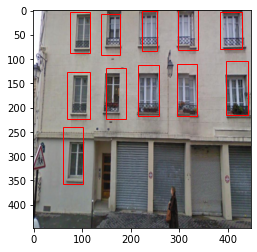

------ Окон на данном изображении: 5 --------


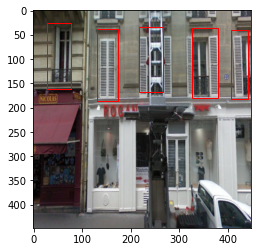

------ Окон на данном изображении: 4 --------


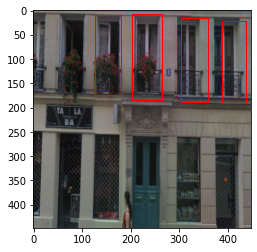

------ Окон на данном изображении: 1 --------


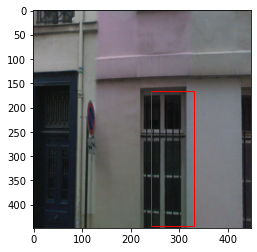

------ Окон на данном изображении: 4 --------


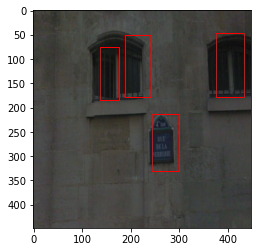

------ Окон на данном изображении: 4 --------


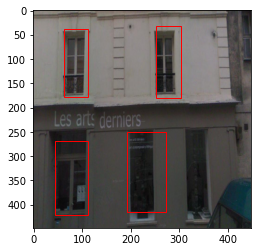

------ Окон на данном изображении: 5 --------


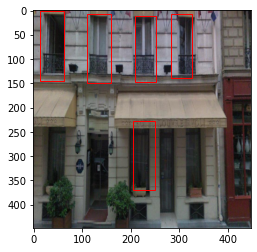

------ Окон на данном изображении: 6 --------


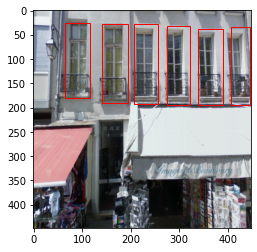

------ Окон на данном изображении: 2 --------


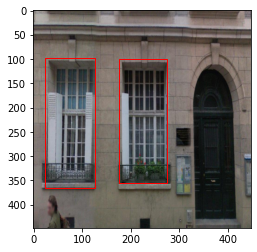

------ Окон на данном изображении: 6 --------


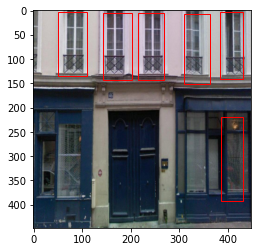

------ Окон на данном изображении: 4 --------


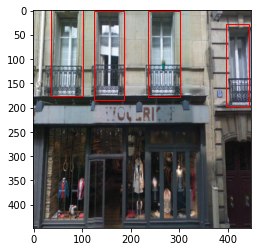

------ Окон на данном изображении: 4 --------


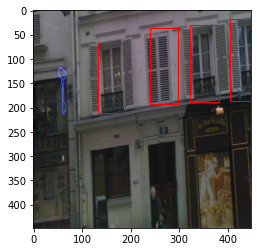

------ Окон на данном изображении: 15 --------


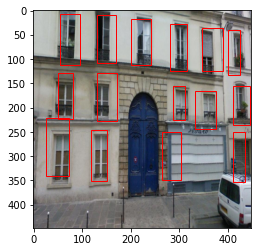

------ Окон на данном изображении: 5 --------


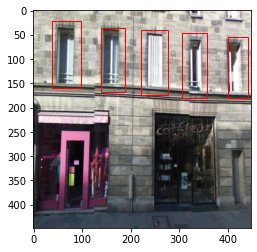

------ Окон на данном изображении: 3 --------


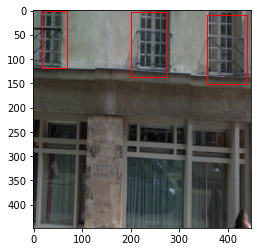

------ Окон на данном изображении: 7 --------


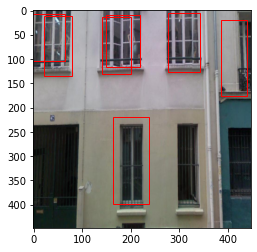

------ Окон на данном изображении: 10 --------


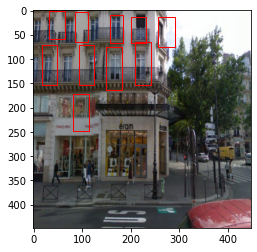

------ Окон на данном изображении: 9 --------


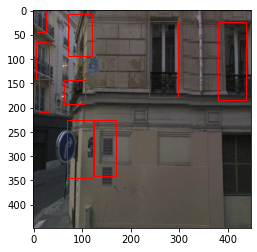

------ Окон на данном изображении: 5 --------


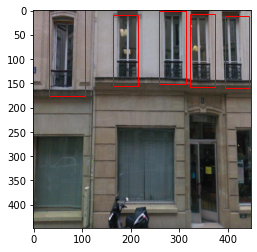

------ Окон на данном изображении: 7 --------


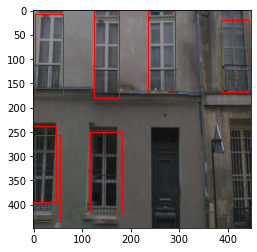

------ Окон на данном изображении: 10 --------


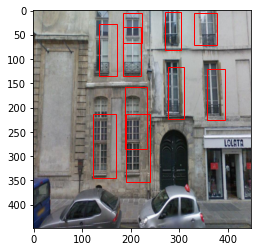

------ Окон на данном изображении: 1 --------


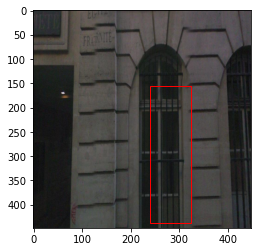

------ Окон на данном изображении: 5 --------


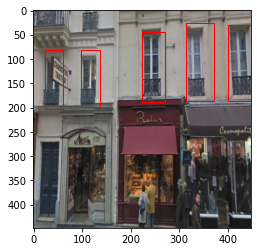

------ Окон на данном изображении: 4 --------


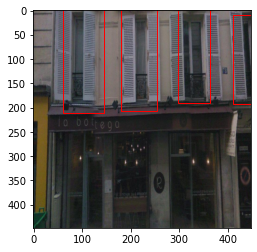

------ Окон на данном изображении: 6 --------


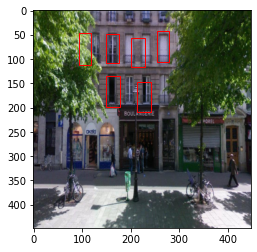

------ Окон на данном изображении: 15 --------


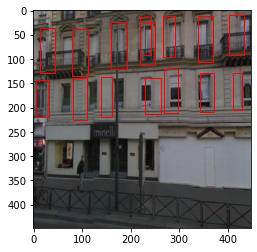

------ Окон на данном изображении: 4 --------


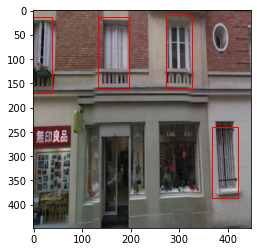

------ Окон на данном изображении: 5 --------


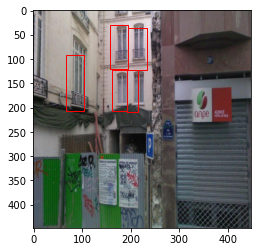

------ Окон на данном изображении: 0 --------


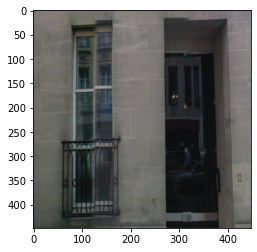

------ Окон на данном изображении: 7 --------


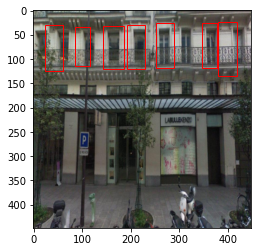

------ Окон на данном изображении: 6 --------


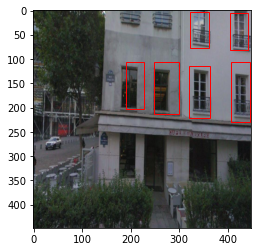

------ Окон на данном изображении: 7 --------


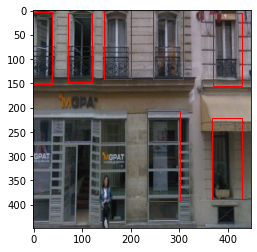

------ Окон на данном изображении: 14 --------


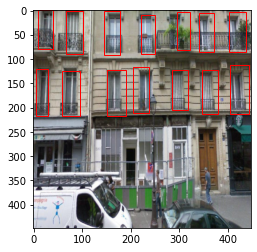

------ Окон на данном изображении: 3 --------


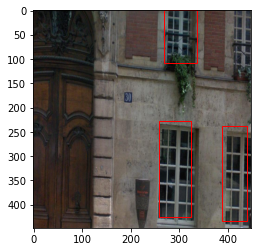

------ Окон на данном изображении: 4 --------


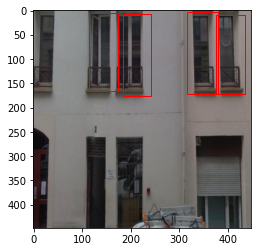

------ Окон на данном изображении: 4 --------


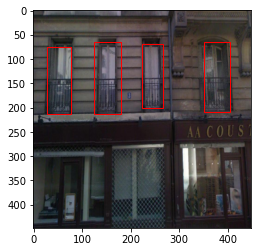

------ Окон на данном изображении: 1 --------


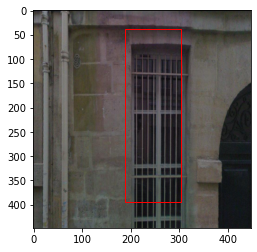

------ Окон на данном изображении: 7 --------


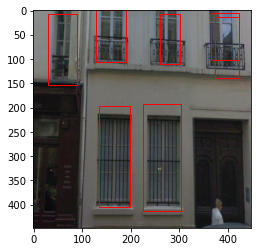

------ Окон на данном изображении: 5 --------


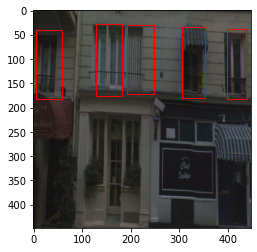

------ Окон на данном изображении: 2 --------


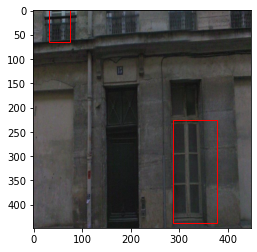

------ Окон на данном изображении: 2 --------


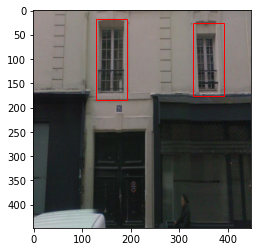

------ Окон на данном изображении: 3 --------


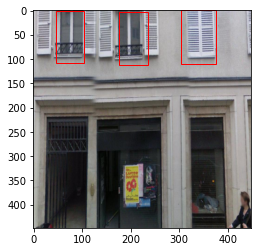

------ Окон на данном изображении: 4 --------


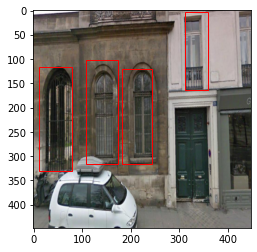

------ Окон на данном изображении: 0 --------


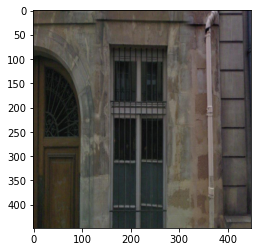

------ Окон на данном изображении: 3 --------


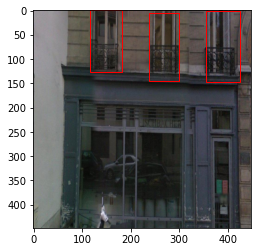

------ Окон на данном изображении: 6 --------


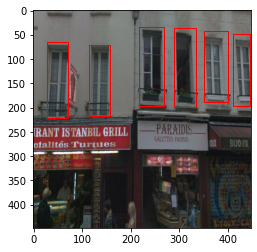

------ Окон на данном изображении: 7 --------


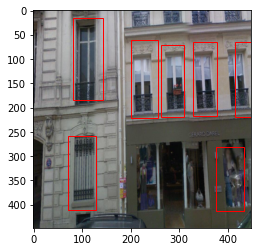

------ Окон на данном изображении: 4 --------


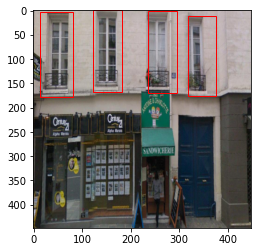

------ Окон на данном изображении: 6 --------


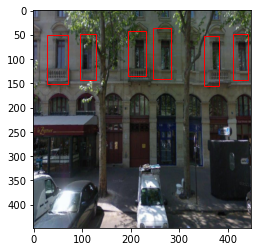

------ Окон на данном изображении: 5 --------


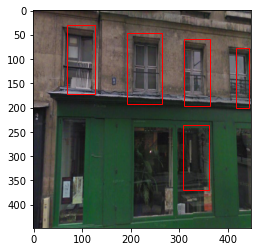

------ Окон на данном изображении: 15 --------


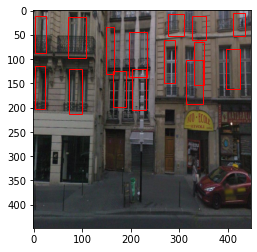

------ Окон на данном изображении: 5 --------


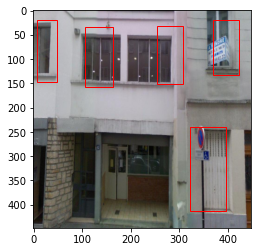

------ Окон на данном изображении: 5 --------


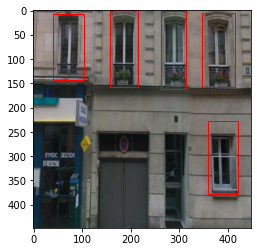

------ Окон на данном изображении: 6 --------


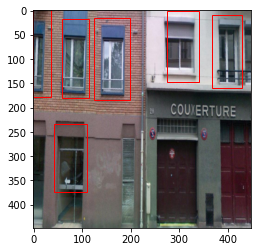

------ Окон на данном изображении: 3 --------


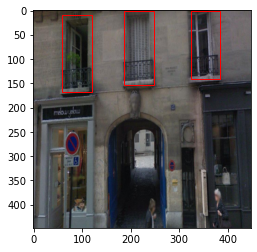

------ Окон на данном изображении: 5 --------


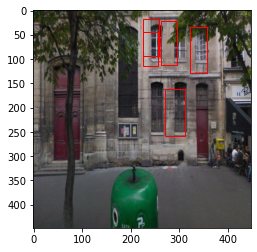

------ Окон на данном изображении: 9 --------


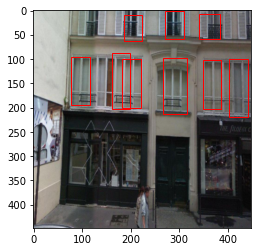

------ Окон на данном изображении: 4 --------


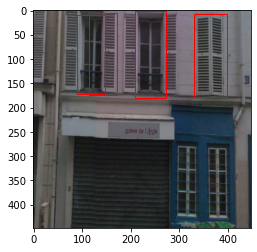

------ Окон на данном изображении: 2 --------


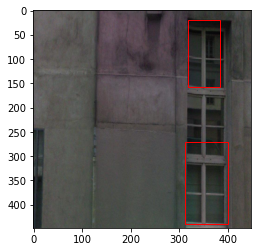

------ Окон на данном изображении: 3 --------


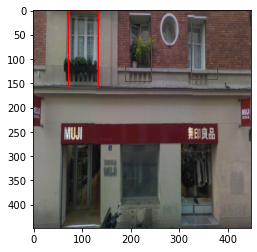

------ Окон на данном изображении: 12 --------


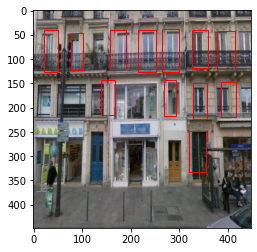

------ Окон на данном изображении: 6 --------


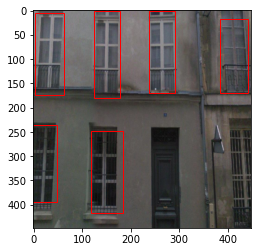

------ Окон на данном изображении: 3 --------


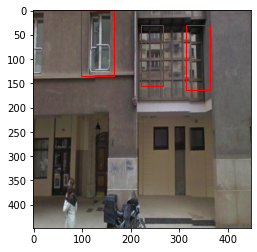

------ Окон на данном изображении: 4 --------


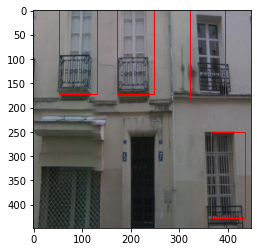

------ Окон на данном изображении: 5 --------


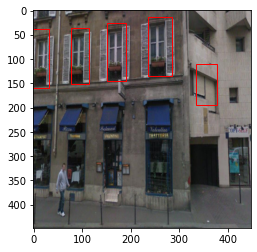

------ Окон на данном изображении: 3 --------


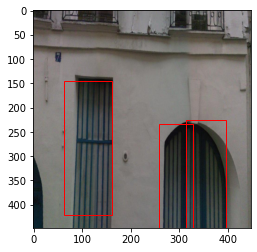

------ Окон на данном изображении: 6 --------


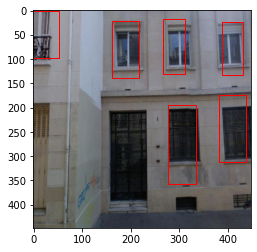

------ Окон на данном изображении: 5 --------


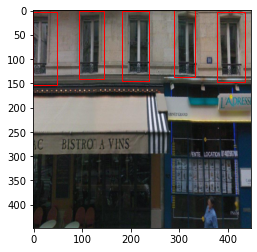

------ Окон на данном изображении: 3 --------


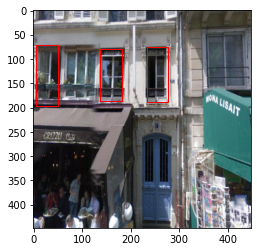

------ Окон на данном изображении: 4 --------


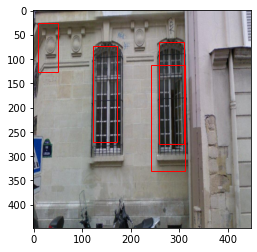

------ Окон на данном изображении: 7 --------


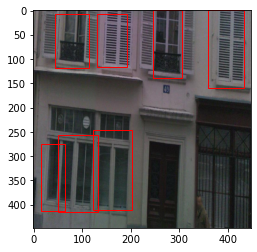

------ Окон на данном изображении: 5 --------


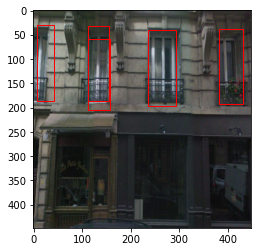

------ Окон на данном изображении: 4 --------


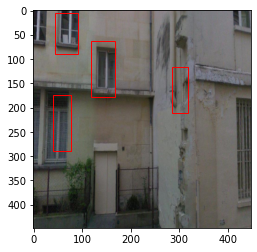

------ Окон на данном изображении: 14 --------


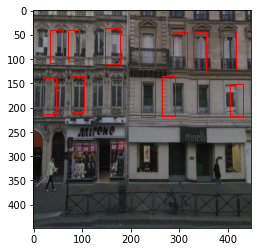

------ Окон на данном изображении: 7 --------


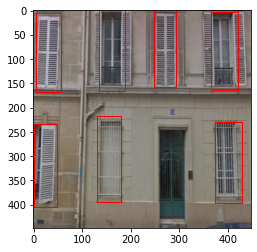

------ Окон на данном изображении: 5 --------


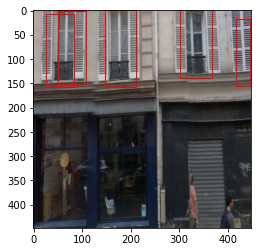

------ Окон на данном изображении: 6 --------


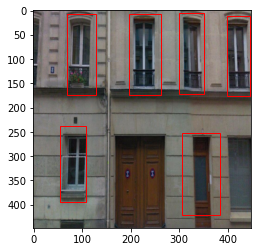

------ Окон на данном изображении: 3 --------


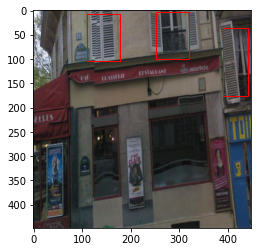

------ Окон на данном изображении: 2 --------


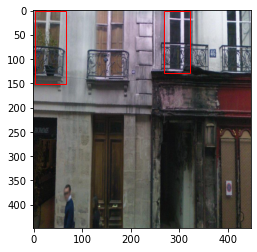

------ Окон на данном изображении: 3 --------


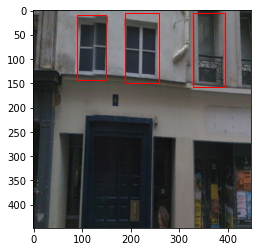

------ Окон на данном изображении: 6 --------


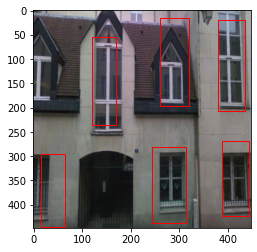

------ Окон на данном изображении: 5 --------


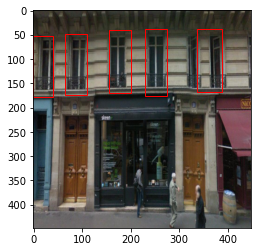

------ Окон на данном изображении: 4 --------


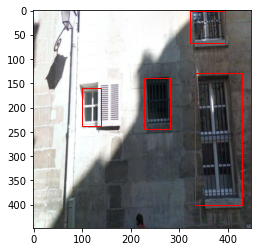

------ Окон на данном изображении: 6 --------


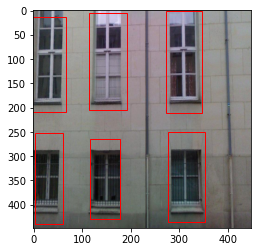

------ Окон на данном изображении: 4 --------


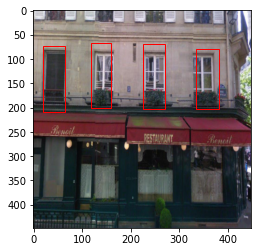

------ Окон на данном изображении: 3 --------


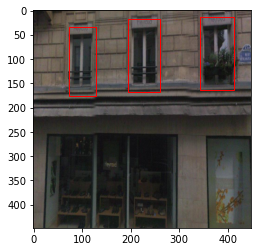

------ Окон на данном изображении: 9 --------


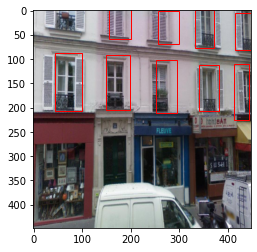

------ Окон на данном изображении: 4 --------


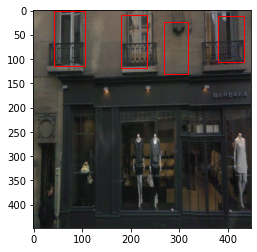

------ Окон на данном изображении: 8 --------


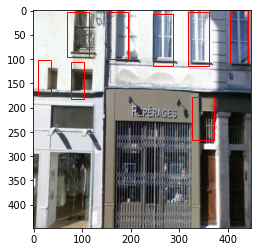

------ Окон на данном изображении: 4 --------


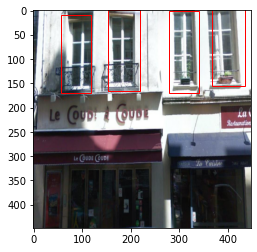

------ Окон на данном изображении: 12 --------


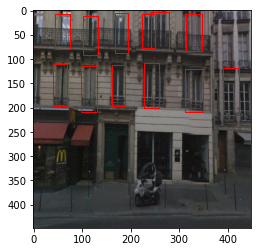

------ Окон на данном изображении: 5 --------


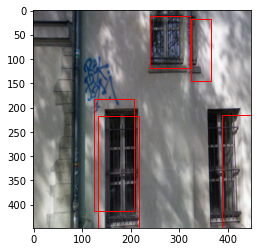

------ Окон на данном изображении: 4 --------


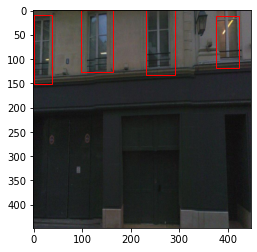

------ Окон на данном изображении: 5 --------


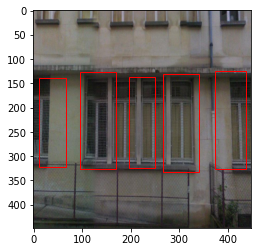

------ Окон на данном изображении: 5 --------


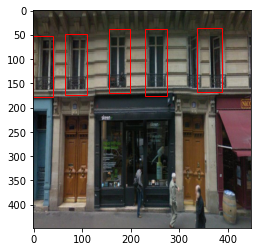

------ Окон на данном изображении: 5 --------


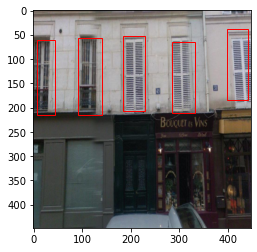

------ Окон на данном изображении: 4 --------


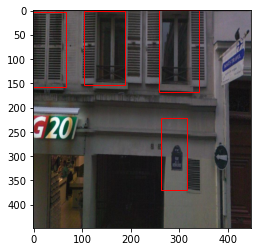

------ Окон на данном изображении: 5 --------


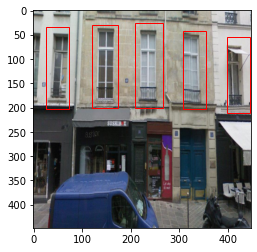

------ Окон на данном изображении: 8 --------


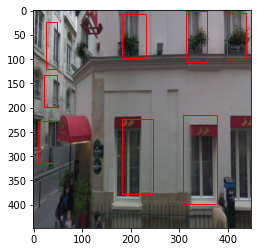

------ Окон на данном изображении: 5 --------


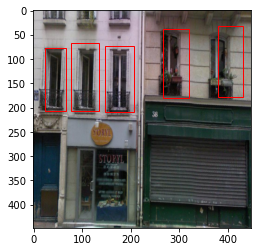

------ Окон на данном изображении: 4 --------


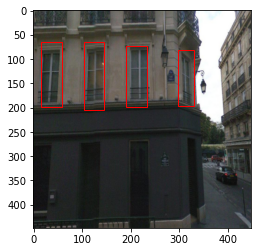

------ Окон на данном изображении: 7 --------


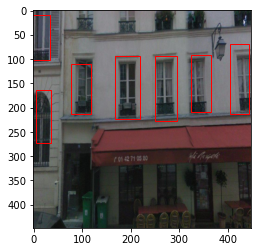

------ Окон на данном изображении: 3 --------


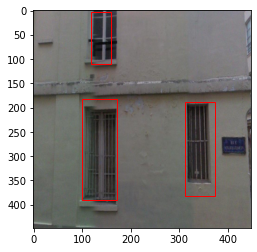

------ Окон на данном изображении: 8 --------


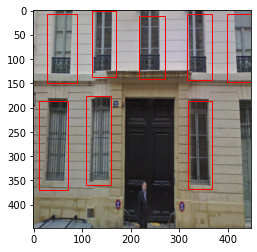

------ Окон на данном изображении: 5 --------


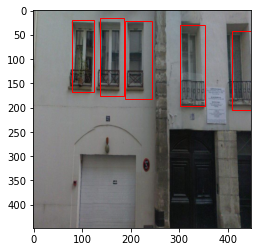

------ Окон на данном изображении: 3 --------


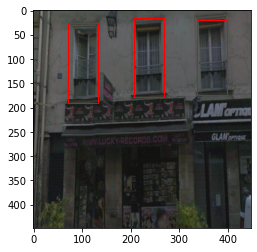

------ Окон на данном изображении: 3 --------


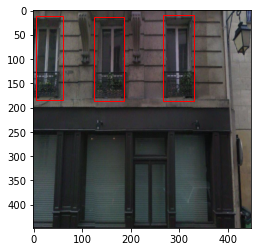

------ Окон на данном изображении: 11 --------


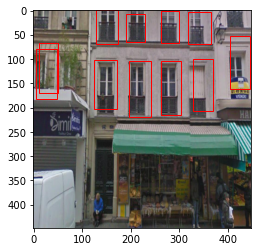

------ Окон на данном изображении: 0 --------


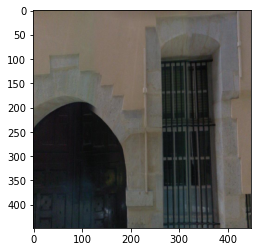

------ Окон на данном изображении: 8 --------


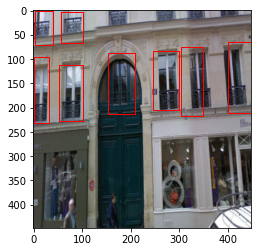

------ Окон на данном изображении: 6 --------


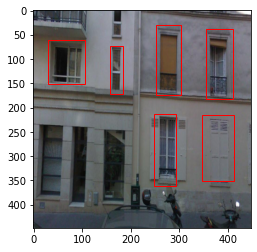

------ Окон на данном изображении: 2 --------


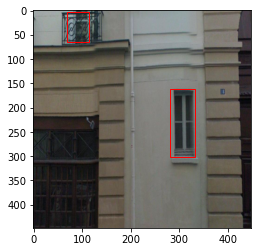

------ Окон на данном изображении: 11 --------


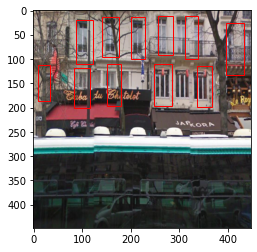

In [14]:
for x, y in test_loader:
    for idx in range(8):
        bboxes = cellboxes_to_boxes(model(x))
        bboxes = non_max_suppression(bboxes[idx], iou_threshold=0.5, threshold=0.4)
        print(f'------ Окон на данном изображении: {len(bboxes)} --------')
        plot_image(x[idx].permute(1,2,0).to('cpu'), bboxes)

Очевидно, не на всех изображениях сеть работает идеально, однако от правды не далека. Рекомендуется добавить обучающих примеров и обучать большее число эпох.